In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from astropy.stats import bootstrap
from astropy.utils import NumpyRNGContext

In [2]:
def bootstrap(data, n=1000, func=np.mean):
    """
    Generate `n` bootstrap samples, evaluating `func`
    at each resampling. `bootstrap` returns a function,
    which can be called to obtain confidence intervals
    of interest.
    """
    simulations = list()
    sample_size = len(data)
    xbar_init = np.mean(data)
    for c in range(n):
        itersample = np.random.choice(data, size=sample_size, replace=True)
        simulations.append(func(itersample))
    simulations.sort()
    def ci(p):
        """
        Return 2-sided symmetric confidence interval specified
        by p.
        """
        u_pval = (1+p)/2.
        l_pval = (1-u_pval)
        l_indx = int(np.floor(n*l_pval))
        u_indx = int(np.floor(n*u_pval))
        return(simulations[l_indx],simulations[u_indx])
    return(ci)

In [3]:
names_control = ["right-center", "center", "left", "left-center", "right"]
names = ["Alt-right", "IDW", "Alt-lite"]
names_list_list = [["Alt-right"], ["IDW"], ["Alt-lite"], names_control]

In [4]:
lines = ['-', '--', '-.', ':', '-', '-.', ':']

# TextBlob

In [37]:
cat = ["pol", "subj"]
#for names_list in names_list_list:
#    print(names_list)
for blob in cat:

    y = []

    x = [i for i in range(2007, 2020)]

    for year in range(2007, 2020):
        y2 = np.array([])
        print(year)
        for name in names_control:

            try:
                with open(f"{name}_{blob}_{year}", "rb") as fp:
                    y1 = pickle.load(fp)
                    y2 = np.concatenate((y2, np.array(y1)), axis=None)

            except:
                continue

        y.append(y2)
    y=np.array(y)

    y_mean = []
    y_std = []
    dyu = []
    dyd = []
    for i in y:
        y_mean.append(np.mean(i))
        y_std.append(np.std(i))
        boot = bootstrap(i)
        c = boot(.95)
        print(c)
        dyd.append(c[0])
        dyu.append(c[1])

    df = pd.DataFrame({"x":x, "y":y_mean, "dyd":dyd, "dyu":dyu, "std":y_std})
    #df = pd.DataFrame({"x":x, "y":y_mean, "std":y_std})
    df.to_csv(f"./bootstrap/control_{blob}.csv")

2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
(0.09326905411818522, 0.12316530804449048)
(0.09148072649803655, 0.10644263788411704)
(0.1176767491906046, 0.12405804251767585)
(0.10408161250478952, 0.10797051628918011)
(0.09535285578252266, 0.09845073827699494)
(0.09302424085735336, 0.09492851650516781)
(0.0902270557063087, 0.09159352736702227)
(0.08964986245318209, 0.09109694719528205)
(0.09703378163093263, 0.09900327736872667)
(0.0790858233700582, 0.08054650629215249)
(0.04929853779297248, 0.050121312853961895)
(0.04112920986921225, 0.04146711305444586)
(0.03891886555984458, 0.039360072936038035)
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
(0.4401569035879925, 0.46728568805727677)
(0.43852513279526933, 0.4520077274705114)
(0.44156746935383046, 0.44746425676369966)
(0.4521460990901707, 0.4554988601235548)
(0.4431791108374772, 0.44587814748956933)
(0.44098569565256013, 0.4428605481077556)
(0.43204049496613467, 0.43339775485333587)
(0.41786380797534

In [23]:
pos = []
neu = []
neg = []
cat = ["subj"]
dif = 0.5
for blob in cat:
    for name in names:
        pos = []
        neu = []
        neg = []
        print(name, blob)
        x = []
        y = []
        for year in range(2007, 2020):
            try:
                with open(f"{name}_{blob}_{year}", "rb") as fp:
                    y1 = pickle.load(fp)
                    x.append(year)
            except:
                continue
            pos.append(np.sum(np.array(y1)>dif)/len(np.array(y1)))
            neg.append(np.sum(np.array(y1)<-dif)/len(np.array(y1)))
            neu.append(1-pos[-1]-neg[-1])
        pos = np.array(pos)
        neg = np.array(neg)
        neu = np.array(neu)
        
        df = pd.DataFrame({"x":x, "pos":pos, "neg":neg, "neu":neu})
        df.to_csv(f"./bootstrap/{name}_{blob}_prop.csv")

Alt-right subj
IDW subj
Alt-lite subj


In [72]:
names = ["Alt-right", "IDW", "Alt-lite", "control"]
pol = []
subj = []
for name in names:
    pol.append(pd.read_csv(f"./bootstrap/{name}_pol.csv"))
    subj.append(pd.read_csv(f"./bootstrap/{name}_subj.csv"))

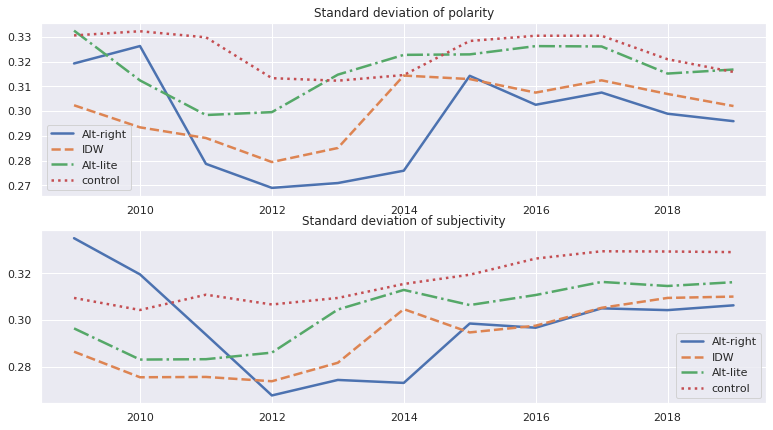

In [41]:
fig = plt.figure(figsize=[13, 7])
ax1 = plt.subplot(211)
ax2 = plt.subplot(212)

for i in range(len(pol)):
    ax1.plot(pol[i].x[2:], pol[i]["std"][2:], lines[i], linewidth=2.5)
ax1.set_title("Standard deviation of polarity")
ax1.legend(names);
for i in range(len(subj)):
    ax2.plot(subj[i].x[2:], subj[i]["std"][2:], lines[i], linewidth=2.5)
ax2.set_title("Standard deviation of subjectivity")
ax2.legend(names);
plt.savefig("./bootstrap/blob_standard_deviation.png")

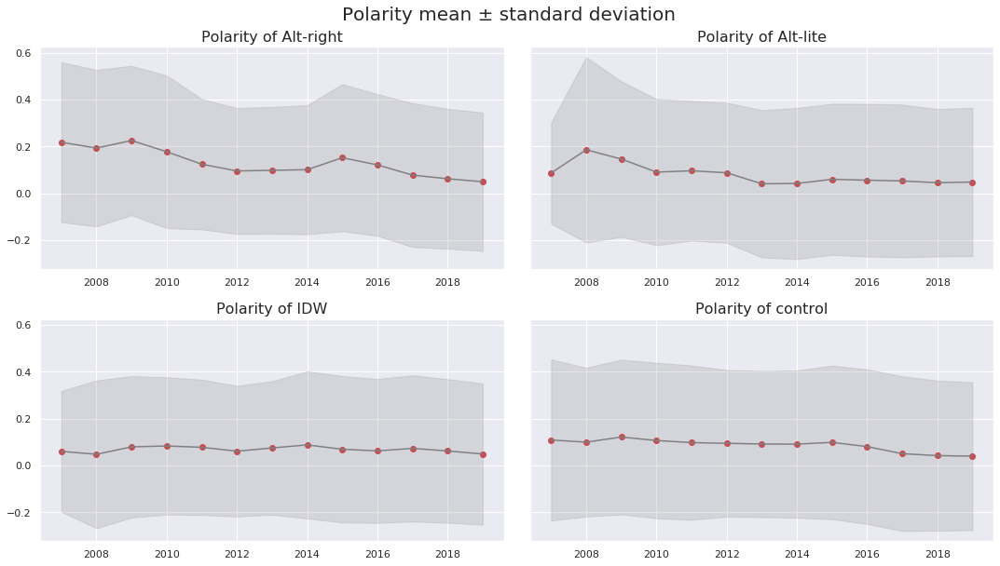

In [79]:
fig, ax = plt.subplots(2, 2, figsize=[15, 8],  squeeze=False, sharey=True)
plt.tight_layout(h_pad=3)
space = ' '
plt.suptitle(f"Polarity mean ± standard deviation", fontsize=20, y=1.05)
for i in range(len(pol)):
    ax[i%2, i//2].set_title(f"Polarity of {names[i]}", fontsize=16)
    ax[i%2, i//2].plot(pol[i].x, pol[i].y, 'or')
    ax[i%2, i//2].plot(pol[i].x, pol[i].y, '-', color='gray')

    ax[i%2, i//2].fill_between(pol[i].x, pol[i].y-pol[i]["std"], pol[i].y+pol[i]["std"],
                     color='gray', alpha=0.2)
plt.savefig("./bootstrap/polarity_mean+-std.png", bbox_inches = 'tight')

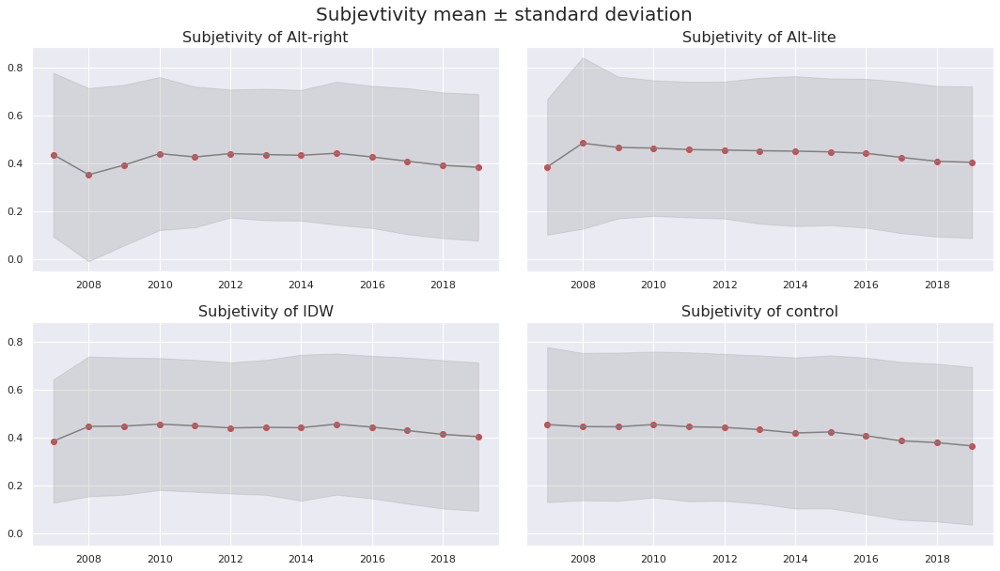

In [80]:
fig, ax = plt.subplots(2, 2, figsize=[15, 8],  squeeze=False, sharey=True)
plt.tight_layout(h_pad=3)
space = ' '
plt.suptitle(f"Subjevtivity mean ± standard deviation", fontsize=20, y=1.05)
for i in range(len(subj)):
    ax[i%2, i//2].set_title(f"Subjetivity of {names[i]}", fontsize=16)
    ax[i%2, i//2].plot(subj[i].x, subj[i].y, 'or')
    ax[i%2, i//2].plot(subj[i].x, subj[i].y, '-', color='gray')

    ax[i%2, i//2].fill_between(subj[i].x, subj[i].y-subj[i]["std"], subj[i].y+subj[i]["std"],
                     color='gray', alpha=0.2)
plt.savefig("./bootstrap/subjectivity_mean+-std.png", bbox_inches = 'tight')

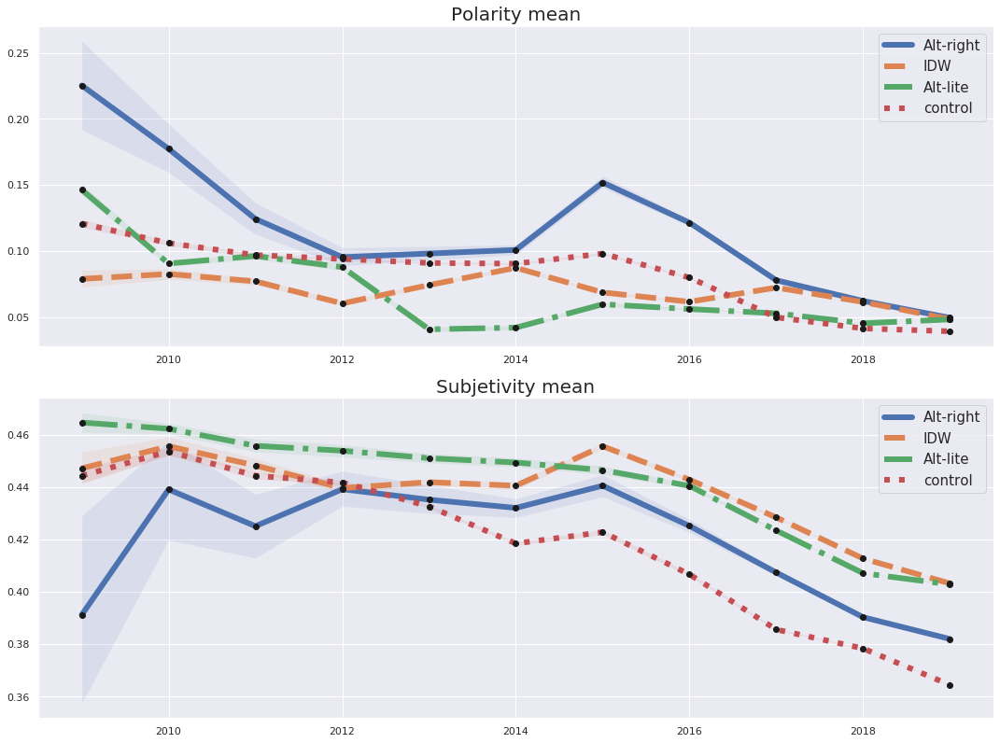

In [78]:
fig, ax = plt.subplots(2, 1, figsize=[15, 7],  squeeze=False)
fig.tight_layout()
plt.subplots_adjust(bottom=-0.5)
space = ' '
#plt.suptitle(f"Polarity {70*space} Subjetivity", fontsize=20, y=1.05)
ax[0, 0].set_title("Polarity mean", fontsize=20)
#ax[0, 0].set_ylim([0.,0.25])
for i in range(len(pol)):
    ax[0, 0].plot(pol[i].x[2:], pol[i].y[2:], lines[i], linewidth=6)
ax[0, 0].legend(names, prop={'size': 15})
for i in range(len(pol)):
    ax[0, 0].plot(pol[i].x[2:], pol[i].y[2:], 'ok')
    ax[0, 0].fill_between(pol[i].x[2:], pol[i]["dyd"][2:], pol[i]["dyu"][2:], alpha=0.1)

ax[1, 0].set_title("Subjetivity mean", fontsize=20)
#ax[1, 0].set_ylim([0.36,0.48])
for i in range(len(subj)):
    ax[1, 0].plot(subj[i].x[2:], subj[i].y[2:], lines[i], linewidth=6)
ax[1, 0].legend(names, prop={'size': 15})
for i in range(len(subj)):
    ax[1, 0].plot(subj[i].x[2:], subj[i].y[2:], 'ok')
    ax[1, 0].fill_between(subj[i].x[2:], subj[i]["dyd"][2:], subj[i]["dyu"][2:], alpha=0.1)
plt.savefig("./bootstrap/blob_mean.png", bbox_inches = 'tight')

In [27]:
names = ["Alt-right", "IDW", "Alt-lite", "control"]
pol = []
subj = []
for name in names:
    pol.append(pd.read_csv(f"./text_blob/proportion/{name}_pol_prop.csv"))
    subj.append(pd.read_csv(f"./text_blob/proportion/{name}_subj_prop.csv"))

In [28]:
x=[i for i in range(2007, 2020)]

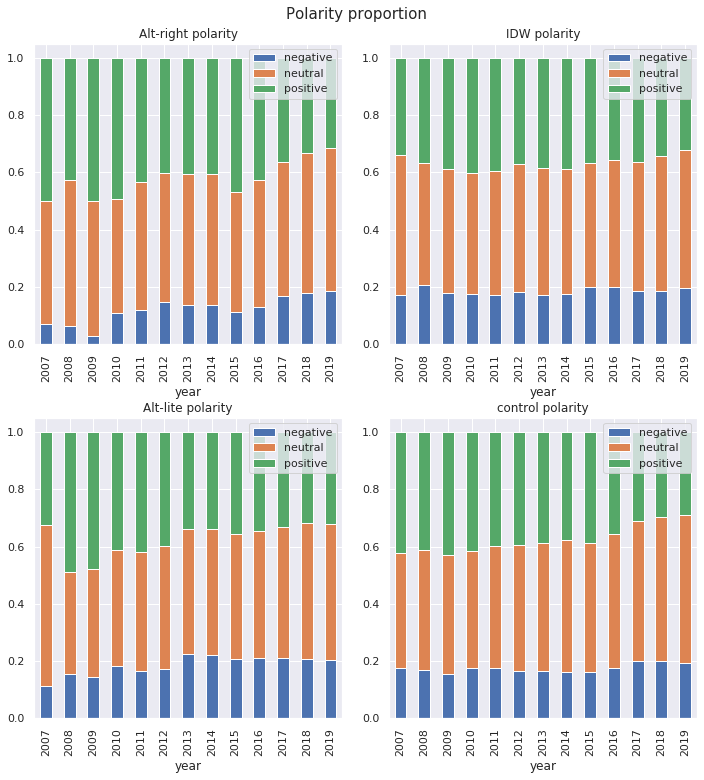

In [82]:
fig, ax = plt.subplots(1, 4, figsize=[10, 40],  squeeze=False)
plt.tight_layout(h_pad=5.0)
plt.suptitle("Polarity proportion", fontsize=30, y=1.03)
for i in range(len(pol)):
    ax[i//4, i%4].set_title((f"{names[i]} polarity"))
    ax[i//4, i%4].xticks()
    df=pd.DataFrame({"year":x, 'negative':pol[i]["neg"], 'neutral':pol[i]["neu"], 'positive':pol[i]["pos"]})
    df.plot(x="year", kind='bar', stacked=True, ax=ax[i//2, i%2])
plt.savefig("./bootstrap/polarity_proportion_bar.png", bbox_inches = 'tight')

In [8]:
x = np.arange(2007, 2020)

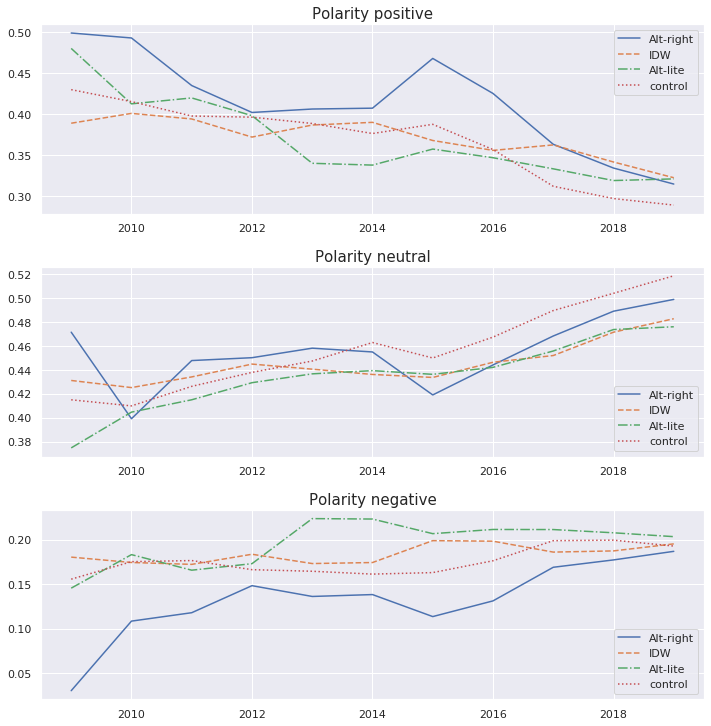

In [83]:
fig, ax = plt.subplots(3, 1, figsize=[10, 10],  squeeze=False)
plt.tight_layout(h_pad=3.0)

ax[0, 0].set_title("Polarity positive", fontsize=15)
for i in range(len(pol)):
    ax[0, 0].plot(pol[i]["x"][2:], pol[i]["pos"][2:], lines[i])
ax[0, 0].legend(names);

ax[1, 0].set_title("Polarity neutral", fontsize=15)
for i in range(len(pol)):
    ax[1, 0].plot(pol[i]["x"][2:], pol[i]["neu"][2:], lines[i])
ax[1, 0].legend(names)

ax[2, 0].set_title("Polarity negative", fontsize=15)
for i in range(len(pol)):
    ax[2, 0].plot(pol[i]["x"][2:], pol[i]["neg"][2:], lines[i])
ax[2, 0].legend(names);
plt.savefig("./bootstrap/polarity_proportion_lines.png", bbox_inches = 'tight')

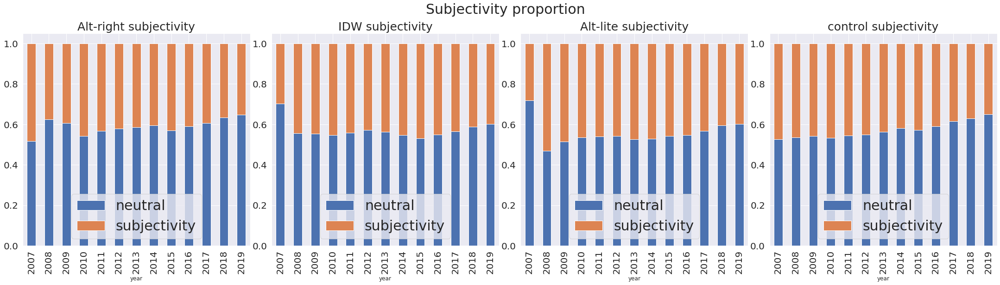

In [42]:
fig, ax = plt.subplots(1, 4, figsize=[30, 7],  squeeze=False)
plt.tight_layout(h_pad=5.0)
plt.suptitle("Subjectivity proportion", fontsize=30, y=1.1)
for i in range(len(subj)):
    ax[i//4, i%4].set_title((f"{names[i]} subjectivity"), size=25)
    ax[i//4, i%4].tick_params(axis='both', labelsize=20)

    df=pd.DataFrame({"year":x, 'neutral':subj[i]["neu"], 'subjectivity':subj[i]["pos"]})
    df.plot(x="year", kind='bar', stacked=True, ax=ax[i//4, i%4])
    ax[i//4, i%4].legend(prop={'size': 30})
plt.savefig("./text_blob/subjectivity_proportion_bars.png", bbox_inches = 'tight')

In [48]:
pos = []
neu = []
neg = []
cat = ["subj", "pol"]
dif = 0.1

for blob in cat:
    for name in names:
        pos = []
        neu = []
        neg = []
        print(name, blob)
        x = [2012, 2015, 2017, 2018, 2019]
        y = []
        for year in range(2007, 2020):
            if year-1 in [2006, 2012, 2015, 2017, 2018, 2019]:
                y2 = np.array([[]])
            try:
                with open(f"{name}_{blob}_{year}", "rb") as fp:
                    y1 = pickle.load(fp)
            except:
                continue
            y2 = np.concatenate((y2, np.array(y1)), axis=None)
            if year not in [2006, 2012, 2015, 2017, 2018, 2019]:
                continue
            pos.append(np.sum(np.array(y2)>dif)/len(np.array(y2)))
            neg.append(np.sum(np.array(y2)<-dif)/len(np.array(y2)))
            neu.append(1-pos[-1]-neg[-1])
        pos = np.array(pos)
        neg = np.array(neg)
        neu = np.array(neu)
        
        df = pd.DataFrame({"x":x, "pos":pos, "neg":neg, "neu":neu})
        df.to_csv(f"./bootstrap/{name}2_{blob}_prop.csv")

Alt-right subj
IDW subj
Alt-lite subj
Alt-right pol
IDW pol
Alt-lite pol


In [60]:
names = ["Alt-right", "IDW", "Alt-lite", "control"]
pol = []
subj = []
for name in names:
    pol.append(pd.read_csv(f"./bootstrap/{name}2_pol_prop.csv"))
    subj.append(pd.read_csv(f"./bootstrap/{name}2_subj_prop.csv"))

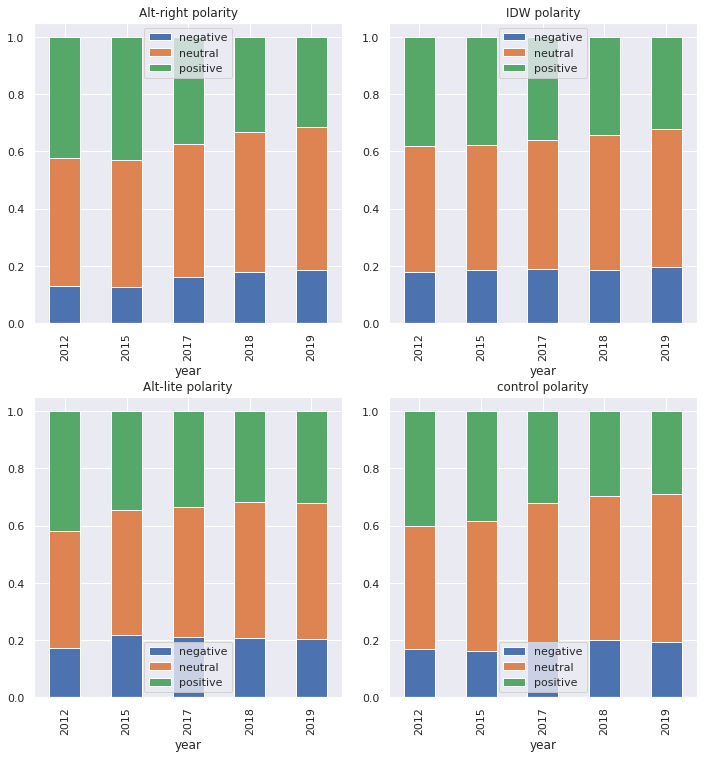

In [50]:
fig, ax = plt.subplots(2, 2, figsize=[10, 10],  squeeze=False)
plt.tight_layout(h_pad=5.0)
for i in range(len(pol)):
    ax[i//2, i%2].set_title((f"{names[i]} polarity"))
    df=pd.DataFrame({"year":x, 'negative':pol[i]["neg"], 'neutral':pol[i]["neu"], 'positive':pol[i]["pos"]})
    df.plot(x="year", kind='bar', stacked=True, ax=ax[i//2, i%2])


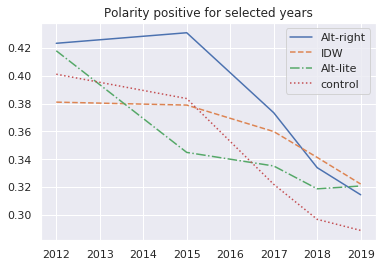

In [64]:
plt.title("Polarity positive for selected years")
for i in range(len(pol)):
        plt.plot(pol[i]["x"], pol[i]["pos"], lines[i])
plt.legend(names)


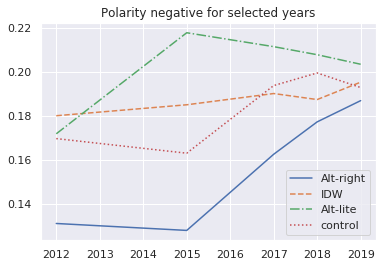

In [65]:
plt.title("Polarity negative for selected years")
for i in range(len(pol)):
        plt.plot(pol[i]["x"], pol[i]["neg"], lines[i])
plt.legend(names)

# Empath

In [5]:
emotion_list = ['size', 'sadness', 'independence', 'positive_emotion', 'family',
                'negative_emotion', 'government', 'love', 'ridicule',
                'masculine', 'feminine', 'violence', 'suffering',
                'dispute', 'anger', 'envy', 'work', 'politics',
                'terrorism', 'shame', 'confusion', 'hate']

In [30]:
for names_list in names_list_list:
    print(names_list)
    y = []
    x = [i for i in range(2007, 2012)]
    dyu = []
    dyd = []
    for year in range(2007, 2012):
        y2 = np.array([[]])
        print(year)
        for name in names_list:

            try:
                with open(f"{name}_empath_{year}", "rb") as fp:
                    y1 = pickle.load(fp)
                    if y2.size==0:
                        y2 = np.array(y1);
                    else:
                        y2 = np.concatenate((y2, np.array(y1)))

            except:
                continue
        print(y2.shape)
        y.append(y2.mean(axis=0))   

        dyu_year= []
        dyd_year = []
        print(y2[:, 0].shape)
        for i in range(22):
            boot = bootstrap(y2[:, i])
            c = boot(.95)
            print(c)
            dyd_year.append(c[0])
            dyu_year.append(c[1])
        dyu.append(dyu_year)
        dyd.append(dyd_year)

    y=np.array(y)
    #print(dyu)

    print(y.shape)
    d={}

    for i in range(len(emotion_list)):
        d[emotion_list[i]] = []
        d[f"{emotion_list[i]}_dyu"] = []
        d[f"{emotion_list[i]}_dyd"] = []       
    d["year"] = x
    for j in range(len(y)):
        for i in range(len(emotion_list)):
            d[emotion_list[i]].append(y[j, i])
            d[f"{emotion_list[i]}_dyu"].append(dyu[j][i])
            d[f"{emotion_list[i]}_dyd"].append(dyd[j][i])       
    df = pd.DataFrame(d)
    df.to_csv(f"./empath/{name}.csv")

2007
(58, 22)
(58,)
(17.896551724137932, 30.862068965517242)
(0.0, 0.0019511998526955353)
(0.0, 0.0)
(0.0022331904245333823, 0.020392551192262725)
(0.0, 0.0015366015794441277)
(0.0002922267679719462, 0.005386896916275409)
(0.0, 0.0)
(0.0020127328577090767, 0.01279857257673845)
(0.0, 0.01293103448275862)
(0.0, 0.009329239489844118)
(0.00023299161230195715, 0.014731172058758265)
(0.0, 0.0036482135438304945)
(0.0, 0.004601962225560066)
(0.0, 0.0)
(0.0, 0.0013012361743656472)
(0.0, 0.0008766803039158388)
(0.0, 0.0011890606420927466)
(0.0, 0.0)
(0.0, 0.0)
(0.0, 0.0039404403118024406)
(0.0, 0.0008766803039158388)
(0.0, 0.0012853136684669712)
2008
(200, 22)
(200,)
(17.525, 22.65)
(0.00017241379310344826, 0.0015580628803245435)
(0.0, 0.0)
(0.004348821714920787, 0.011007013296175497)
(0.0007967415759063251, 0.004521470573196298)
(0.0006746831797235023, 0.004732411674347158)
(0.0, 0.0)
(0.0018569612858405958, 0.006645126319758673)
(0.0, 0.0)
(0.0, 0.0008814102564102563)
(0.0015256410256410259, 0

In [31]:
df

,size,size_dyu,size_dyd,sadness,sadness_dyu,sadness_dyd,independence,independence_dyu,independence_dyd,positive_emotion,...,shame,shame_dyu,shame_dyd,confusion,confusion_dyu,confusion_dyd,hate,hate_dyu,hate_dyd,year
0,24.051724,30.862069,17.896552,0.000867,0.001951,0.000000,0.000000,0.000000,0.000000,0.009240,...,0.001578,0.003940,0.000000,0.000292,0.000877,0.000000,0.000477,0.001285,0.000000,2007
1,19.875000,22.650000,17.525000,0.000786,0.001558,0.000172,0.000000,0.000000,0.000000,0.007243,...,0.001066,0.002341,0.000147,0.000303,0.000833,0.000000,0.001709,0.003324,0.000365,2008
2,26.963746,29.640483,24.214502,0.001503,0.002569,0.000637,0.000163,0.000409,0.000000,0.010992,...,0.002079,0.003746,0.000780,0.000742,0.001718,0.000206,0.001847,0.003446,0.000729,2009
3,27.829333,29.360889,26.312889,0.000833,0.001190,0.000536,0.000435,0.000645,0.000265,0.007428,...,0.000842,0.001207,0.000534,0.000806,0.001125,0.000528,0.002973,0.004503,0.001701,2010
4,36.514326,37.801785,35.223579,0.001103,0.001413,0.000831,0.000819,0.001097,0.000585,0.008855,...,0.001381,0.001742,0.001071,0.001428,0.001752,0.001134,0.002070,0.002527,0.001633,2011


In [7]:
names = ["Alt-right", "IDW", "Alt-lite", "control"]
empath = []
for name in names:
    empath.append(pd.read_csv(f"./empath/dataframes/{name}.csv"))
   

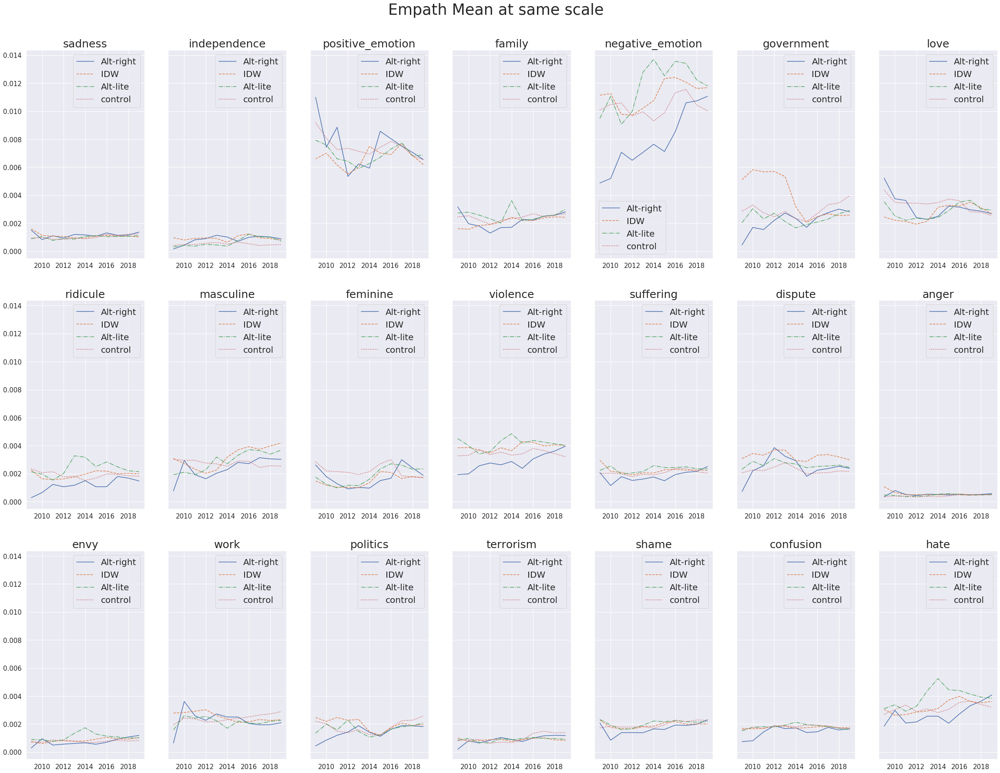

In [43]:
fig, ax = plt.subplots(3, 7, figsize=[40, 30],  squeeze=False, sharey=True)
c=0
plt.suptitle("Empath Mean at same scale", fontsize=35, y=.93)
for emotion in emotion_list[1:]:
    ax[c//7, c%7].set_title(emotion, fontsize=25)
    for i in range(len(names)):
        ax[c//7, c%7].plot(empath[i]["year"][2:], empath[i][emotion][2:], lines[i])
        
    ax[c//7, c%7].legend(names, fontsize=20)
    ax[c//7, c%7].tick_params(axis='both', labelsize=15)
    c+=1
plt.savefig("./empath/empath_sharey.png", bbox_inches = 'tight')

In [8]:
for name in names:
    print(name)
    x = [2012, 2015, 2017, 2018, 2019]
    y = []
    for year in range(2007, 2020):
        if year-1 in [2006, 2012, 2015, 2017, 2018, 2019]:
            y2 = np.array([[]])
        try:
            with open(f"{name}_empath_{year}", "rb") as fp:
                y1 = pickle.load(fp)
        except:
            continue
        print(year)
        if y2.size==0:
            y2 = np.array(y1);
        else:
            y2 = np.concatenate((y2, np.array(y1)))

        if year not in [2006, 2012, 2015, 2017, 2018, 2019]:
            continue
        y.append(y2.mean(axis=0))
    y=np.array(y)
    
    print(y.shape)

    d={}

    for i in range(len(emotion_list)):
        d[emotion_list[i]] = []
    d["year"] = x
    for j in range(len(y)):
        for i in range(len(emotion_list)):
            d[emotion_list[i]].append(y[j, i])
    df = pd.DataFrame(d)
    df.to_csv(f"./empath/{name}2.csv")

Alt-right
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
(5, 22)
IDW
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
(5, 22)
Alt-lite
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
(5, 22)


In [9]:
names = ["Alt-right", "IDW", "Alt-lite", "control"]
empath = []
for name in names:
    empath.append(pd.read_csv(f"./empath/{name}2.csv"))
   

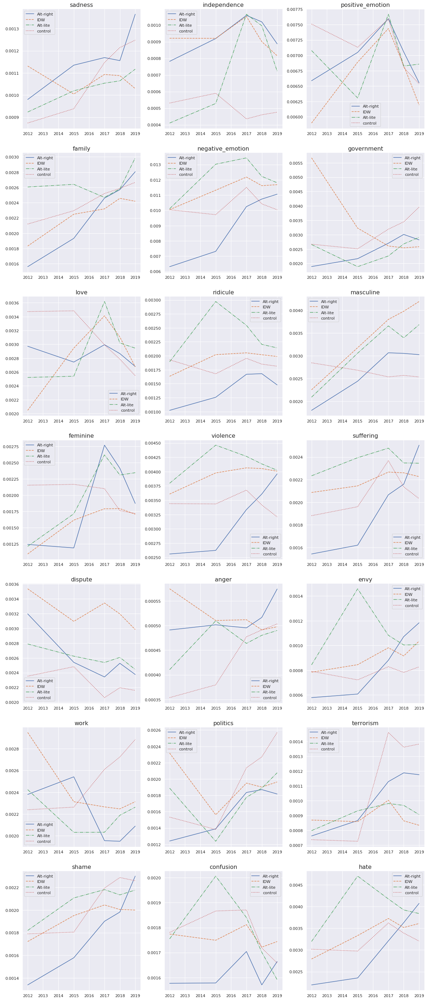

In [11]:
fig, ax = plt.subplots(7, 3, figsize=[20, 50],  squeeze=False)
c=0
for emotion in emotion_list[1:]:
    ax[c//3, c%3].set_title(emotion, fontsize=16)
    for i in range(len(names)):
        ax[c//3, c%3].plot(empath[i]["year"], empath[i][emotion], lines[i])
    ax[c//3, c%3].legend(names)
    c+=1
plt.savefig("./empath/plots2.png")

# Polarity + Empath

In [8]:
names.append("control")

In [44]:
x = [year for year in range(2007, 2020)]

In [60]:
y = []
names = ["Alt-right", "IDW", "Alt-lite", "control"]
for name in names:
    y.append(pd.read_csv(f"./empath_blob/dataframe/{name}_pol_empath_prop_boots.csv"))

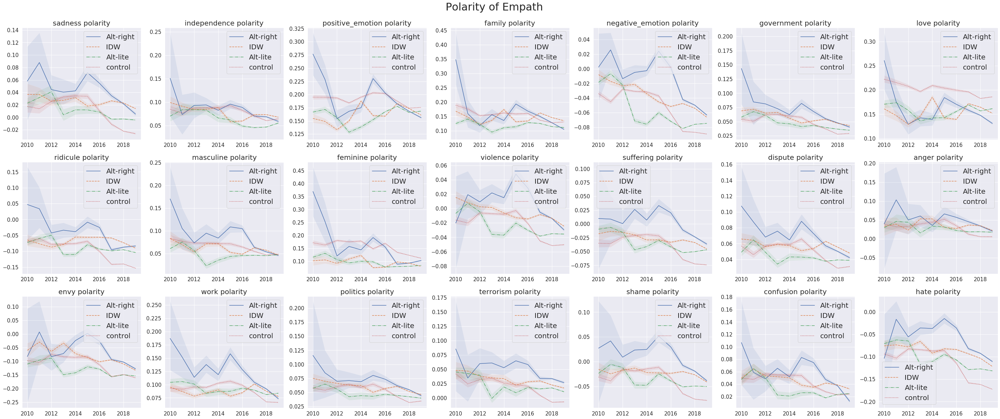

In [70]:
fig, ax = plt.subplots(3, 7, figsize=[50, 20],  squeeze=False)
c=0
plt.suptitle("Polarity of Empath", fontsize=30, y=.93)

for emotion in emotion_list[1:]:
    ax[c//7, c%7].set_title(f'{emotion} polarity', fontsize=20)
    for i in range(len(names)):
        ax[c//7, c%7].plot(y[i]["year"][3:], y[i][emotion][3:], lines[i])
        ax[c//7, c%7].fill_between(y[i]["year"][3:], y[i][f"{emotion}_dyd"][3:],
                                   y[i][f"{emotion}_dyu"][3:], alpha=0.1)    
    ax[c//7, c%7].legend(names, fontsize=20)
    ax[c//7, c%7].tick_params(axis='both', labelsize=15)

    c+=1
plt.savefig("./empath_blob/Polarity_Empath.png")

In [61]:
y = []
for name in names:
    with open(f"./empath_blob/{name}_pol_empath_prop", "rb") as fp:
        y1 = pickle.load(fp)
    y.append(y1)

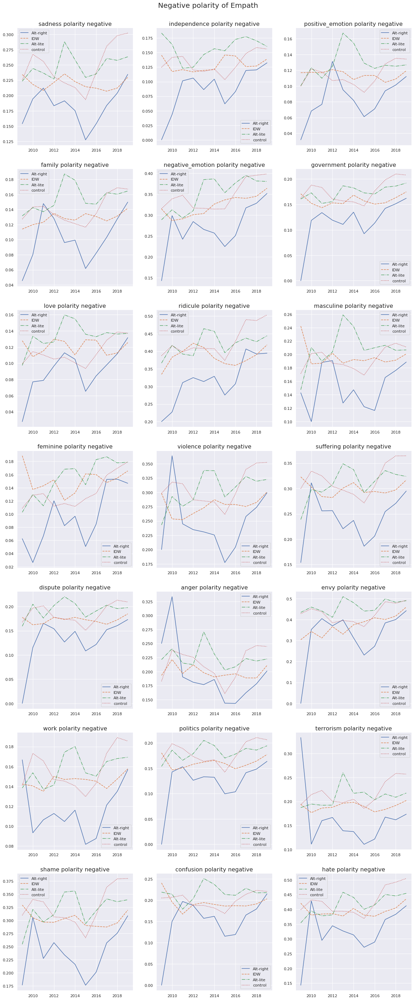

In [64]:
fig, ax = plt.subplots(7, 3, figsize=[20, 50],  squeeze=False)
c=0
plt.suptitle("Negative polarity of Empath", fontsize=20, y=0.9)

for emotion in emotion_list[1:]:
    ax[c//3, c%3].set_title(f'{emotion} polarity negative', fontsize=16)
    for i in range(len(names)):
        ax[c//3, c%3].plot(x[2:], y[i][emotion_list.index(emotion)-1][0][2:], lines[i])
    ax[c//3, c%3].legend(names)
    c+=1
plt.savefig("./empath_blob/negative_polarity_empath.png")

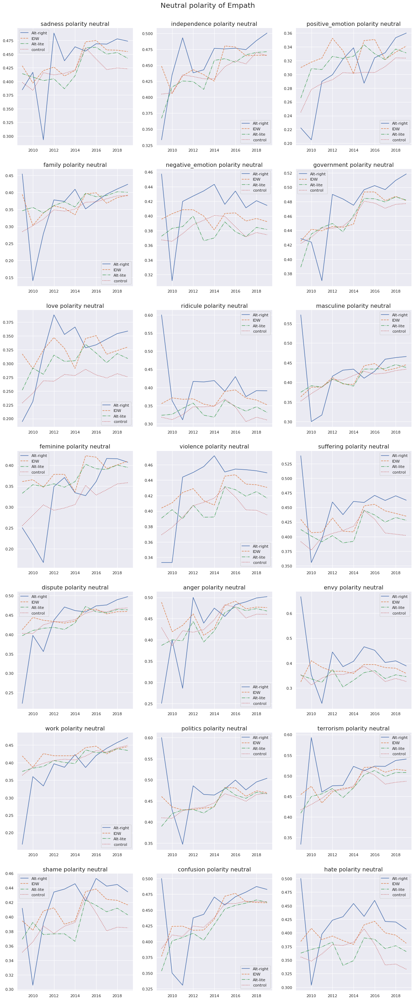

In [87]:
fig, ax = plt.subplots(7, 3, figsize=[20, 50],  squeeze=False)
c=0
plt.suptitle("Neutral polarity of Empath", fontsize=20,y=0.9)

for emotion in emotion_list[1:]:
    ax[c//3, c%3].set_title(f'{emotion} polarity neutral', fontsize=16)
    for i in range(len(names)):
        ax[c//3, c%3].plot(x[2:], y[i][emotion_list.index(emotion)-1][1][2:], lines[i])
    ax[c//3, c%3].legend(names)
    c+=1
plt.savefig("./empath_blob/neutral_polarity_empath.png")

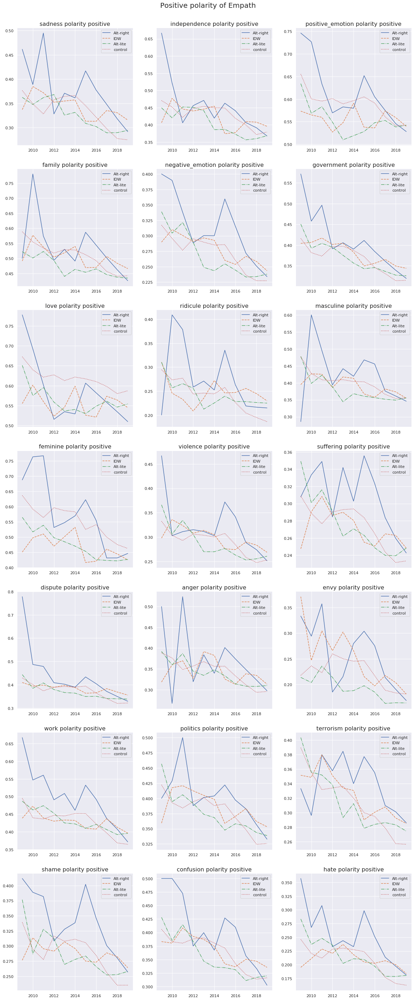

In [88]:
fig, ax = plt.subplots(7, 3, figsize=[20, 50],  squeeze=False)
c=0
plt.suptitle("Positive polarity of Empath", fontsize=20, y=.9)

for emotion in emotion_list[1:]:
    ax[c//3, c%3].set_title(f'{emotion} polarity positive', fontsize=16)
    for i in range(len(names)):
        ax[c//3, c%3].plot(x[2:], y[i][emotion_list.index(emotion)-1][2][2:], lines[i])
    ax[c//3, c%3].legend(names)
    c+=1
plt.savefig("./empath_blob/positive_polarity_empath.png")

# Perspective + Empath

In [3]:
attributes = ['TOXICITY', 'SEVERE_TOXICITY', 'IDENTITY_ATTACK', 'INSULT',
             'PROFANITY', 'THREAT', 'SEXUALLY_EXPLICIT',  'FLIRTATION']
emotion_list = ['size', 'sadness', 'independence', 'positive_emotion', 'family',
                'negative_emotion', 'government', 'love', 'ridicule',
                'masculine', 'feminine', 'violence', 'suffering',
                'dispute', 'anger', 'envy', 'work', 'politics',
                'terrorism', 'shame', 'confusion', 'hate']

In [5]:
def plot_persp_empath(attr):
    y = []
    names = ["Alt-right", "IDW", "Alt-lite", "control"]
    for name in names:
        y.append(pd.read_csv(f"./empath_perspective/{name}_{attr}_empath.csv"))
        
    fig, ax = plt.subplots(7, 3, figsize=[20, 50],  squeeze=False, sharey=True)
    c=0
    plt.suptitle(f"{attr} of Empath", fontsize=20, y=.9)

    for emotion in emotion_list[1:]:
        ax[c//3, c%3].set_title(f'{emotion} {attr} mean', fontsize=16)
        for i in range(len(names)):
            ax[c//3, c%3].plot(y[i]["year"][3:], y[i][emotion][3:], lines[i])
            ax[c//3, c%3].fill_between(y[i]["year"][3:], y[i][f"{emotion}_dyd"][3:],
                                       y[i][f"{emotion}_dyu"][3:], alpha=0.1)    
        ax[c//3, c%3].legend(names)
        c+=1
    plt.savefig(f"./empath_perspective/{attr}_Empath.png", bbox_inches = 'tight')
    plt.show()
    plt.close()

In [25]:
lines = ['-', '--', '-.', ':',  '-.', ':','--', '-']

In [55]:
attributes = ['TOXICITY', 'SEVERE_TOXICITY', 'IDENTITY_ATTACK', 'INSULT',
             'PROFANITY', 'THREAT', 'SEXUALLY_EXPLICIT',  'FLIRTATION']

attributes = ['TOXICITY', 'SEVERE_TOXICITY', 'IDENTITY_ATTACK', 'INSULT', 'THREAT']

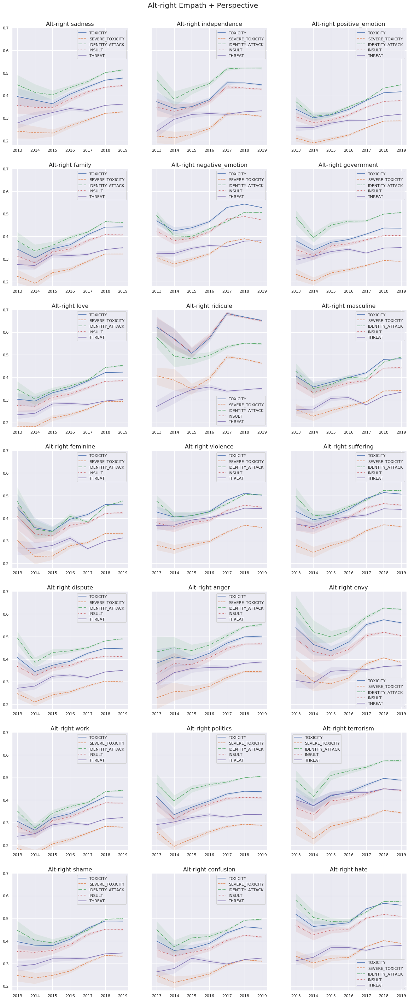

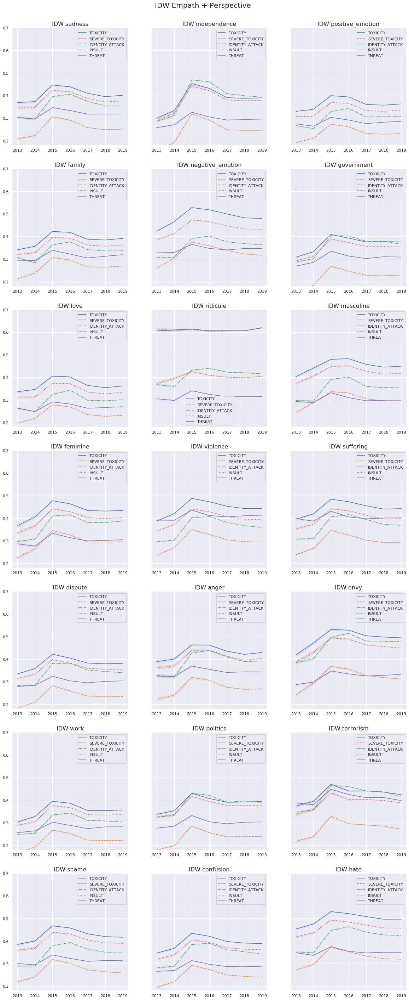

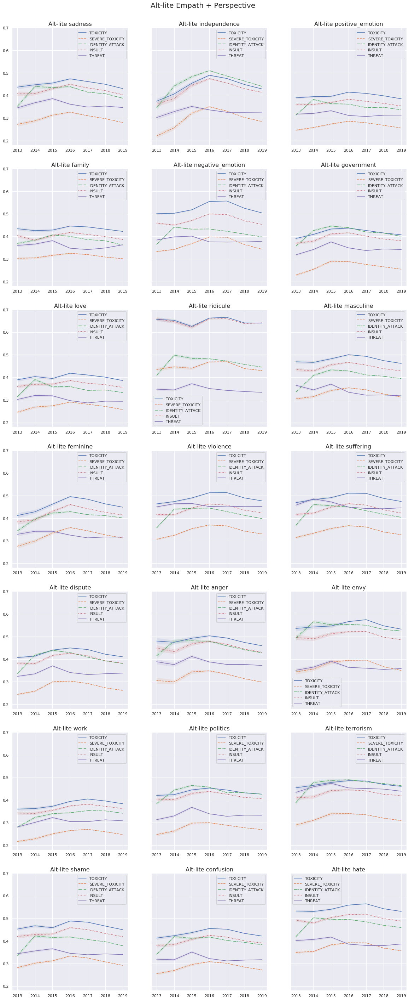

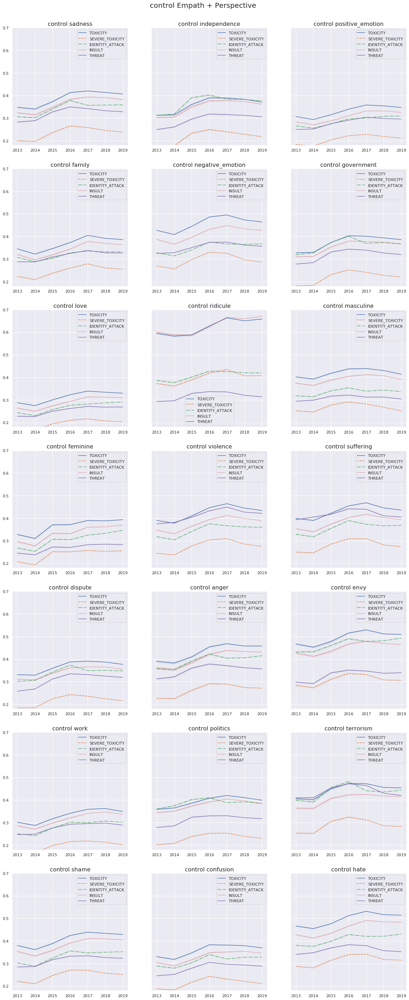

In [57]:
names = ["Alt-right", "IDW", "Alt-lite", "control"]
for name in names:
    y = []
    for attr in attributes:
        y.append(pd.read_csv(f"./empath_perspective/dataframes/{name}_{attr}_empath.csv"))

    fig, ax = plt.subplots(7, 3, figsize=[20, 50],  squeeze=False, sharey=True)
    c=0
    plt.suptitle(f"{name} Empath + Perspective", fontsize=20, y=.9)
    for emotion in emotion_list[1:]:
        ax[c//3, c%3].set_ylim([0.18, 0.7])
        ax[c//3, c%3].set_title(f'{name} {emotion}', fontsize=16)
        for i in range(len(attributes)):
            ax[c//3, c%3].plot(y[i]["year"][3:], y[i][emotion][3:], lines[i])
            ax[c//3, c%3].fill_between(y[i]["year"][3:], y[i][f"{emotion}_dyd"][3:],
                                       y[i][f"{emotion}_dyu"][3:], alpha=0.1)    
        ax[c//3, c%3].legend(attributes)
        
        c+=1
    plt.savefig(f"./empath_perspective/{name}_Empath_Perspective.png", bbox_inches = 'tight')
    plt.show()
    plt.close()

# Perspective

In [78]:
attributes = ['TOXICITY', 'SEVERE_TOXICITY', 'IDENTITY_ATTACK', 'INSULT',
             'PROFANITY', 'THREAT', 'SEXUALLY_EXPLICIT',  'FLIRTATION']

In [10]:
names = ["Alt-lite"]

for name in names:
    print(name)
    x = []
    y = []
    for year in range(2010, 2020):
        try:
            with open(f"./perspective/{name}_perspective_{year}", "rb") as fp:
                y1 = pickle.load(fp)
                x.append(year)
        
            y2 = []
            for i in y1:
                if len(i)==0:
                    continue
                y2.append(np.array([*i]))
            if len(y2)==0:
                print()
            y.append(np.array(y2).mean(axis=0))
        except:
            continue
            
    y=np.array(y)

    dyu = []
    dyd = []
    print(y.shape)
    #for i in y:
    #    y_mean.append(y.mean(axis=0))
        #boot = bootstrap(i)
        #c = boot(.95)
        #print(c)
        #dyd.append(c[0])
        #dyu.append(c[1])
    d={}
    
    for i in range(len(attributes)):
        d[attributes[i]] = []
    d["year"] = x
    for j in range(len(y)):
        for i in range(len(attributes)):
            d[attributes[i]].append(y[j, i])
    df = pd.DataFrame(d)
    df.to_csv(f"./perspective/{name}.csv")

Alt-lite
(10, 8)


In [21]:
#for names_list in names_list_list:
#    print(names_list)
y = []
x = [i for i in range(2010, 2020)]
dyu = []
dyd = []
for year in range(2010, 2020):
    y2 = np.array([[]])
    print(year)
    for name in ["IDW"]:

        try:
            with open(f"./perspective/{name}_perspective_{year}", "rb") as fp:
                y1 = pickle.load(fp)
                y3 = []
            for i in y1:
                if len(i)==0:
                    continue
                y3.append(np.array([*i]))
                
            if y2.size==0:
                y2 = np.array(y3);
            else:
                y2 = np.concatenate((y2, np.array(y3)))

        except:
            continue
    print(y2.shape)
    y.append(y2.mean(axis=0))   

    dyu_year= []
    dyd_year = []
    print(y2[:, 0].shape)
    if year<2017:
        for i in range(8):
            boot = bootstrap(y2[:, i])
            c = boot(.95)
            print(c)
            dyd_year.append(c[0])
            dyu_year.append(c[1])
    else:
        for i in range(8):
            dyd_year.append(0)
            dyu_year.append(0)
    dyu.append(dyu_year)
    dyd.append(dyd_year)

y=np.array(y)

print(y.shape)
d={}
for i in range(len(attributes)):
    d[attributes[i]] = []
    d[f"{attributes[i]}_dyu"]=[]
    d[f"{attributes[i]}_dyd"]=[]  
d["year"] = x
for j in range(len(y)):
    for i in range(len(attributes)):
        d[attributes[i]].append(y[j, i])
        d[f"{attributes[i]}_dyu"].append(dyu[j][i])
        d[f"{attributes[i]}_dyd"].append(dyd[j][i])      
df = pd.DataFrame(d)
df.to_csv(f"./perspective/{name}2.csv")

2010
(21951, 8)
(21951,)
(0.3413542935195937, 0.34891271581837735)
(0.20637698127324497, 0.21243891880009566)
(0.2418620504448089, 0.2471592166001002)
(0.3074122054154025, 0.31448429281035034)
(0.27637127370942094, 0.28465822899445586)
(0.26342475962764794, 0.26818247110976723)
(0.18408299670873765, 0.18908304484542846)
(0.3294279956704022, 0.33325755354653547)
2011
(42804, 8)
(42804,)
(0.34949122874323896, 0.3546135365596486)
(0.21239493931472062, 0.21658133321276515)
(0.25858317556555227, 0.26232595032098166)
(0.3164560366947575, 0.32174925159448414)
(0.27878609754520367, 0.28427648313464865)
(0.26421880715264934, 0.26727132785754837)
(0.18289402182723108, 0.18631116891710356)
(0.33625041218804314, 0.33894883767734324)
2012
(106149, 8)
(106149,)
(0.35619875326057615, 0.35928232464304327)
(0.21861939325000423, 0.22132123802660364)
(0.2869096499330903, 0.28937614287595836)
(0.3260793790231815, 0.329297010614571)
(0.2769058882965944, 0.28018734535676737)
(0.2763223972765245, 0.278524762

In [28]:
!mv testright.csv control2.csv

mv: cannot stat 'testright.csv': No such file or directory


In [74]:
names = ["Alt-right", "IDW", "Alt-lite", "control"]
perspective = []
for name in names:
    perspective.append(pd.read_csv(f"./perspective/dataframes/{name}2.csv"))
   

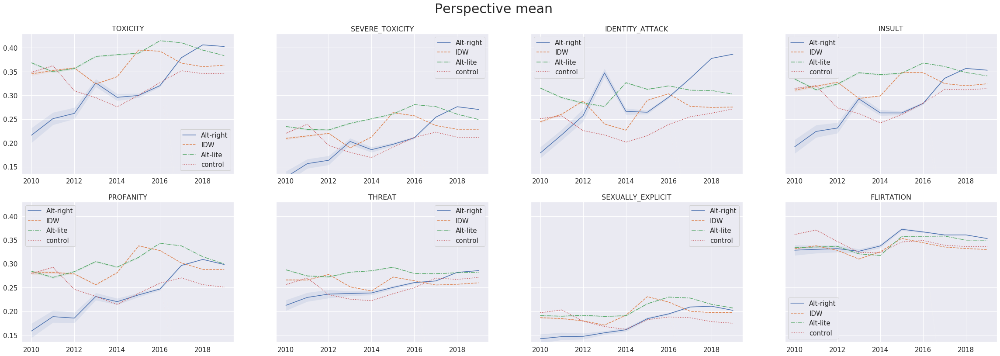

In [95]:
fig, ax = plt.subplots(2, 4, figsize=[40, 13],  squeeze=False, sharey=True)
c=0
plt.suptitle("Perspective mean", fontsize=30, y=0.955)
for emotion in attributes:
    ax[c//4, c%4].set_ylim([0.135,0.43])
    ax[c//4, c%4].set_title(emotion, fontsize=16)
    for i in range(len(names)):
        ax[c//4, c%4].plot(perspective[i]["year"], perspective[i][emotion], lines[i])
        ax[c//4, c%4].fill_between(perspective[i]["year"], perspective[i][f"{emotion}_dyd"],
                                   perspective[i][f"{emotion}_dyu"], alpha=0.1)
    ax[c//4, c%4].legend(names, prop={'size': 15})
    ax[c//4, c%4].tick_params(axis='both', labelsize=15)


    c+=1
plt.savefig("./perspective/perspective_sharey.png")    

# Pearson coeficient

In [9]:
emotion_list = ['sadness', 'independence', 'positive_emotion', 'family',
                'negative_emotion', 'government', 'love', 'ridicule',
                'masculine', 'feminine', 'violence', 'suffering',
                'dispute', 'anger', 'envy', 'work', 'politics',
                'terrorism', 'shame', 'confusion', 'hate']
attributes = ['TOXICITY', 'SEVERE_TOXICITY', 'IDENTITY_ATTACK', 'INSULT',
             'PROFANITY', 'THREAT', 'SEXUALLY_EXPLICIT',  'FLIRTATION']

In [82]:
len(emotion_list)

21

In [326]:
def plot_pearson_matrix(matrix, title, size, xticklabels, yticklabels):
    nr_rows = 1
    nr_cols = 1  
    prop = size/18

    fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*size,nr_rows*size-2), squeeze=False)

    plt.suptitle(title, y=1.01, fontsize=25*prop)
    plt.xticks(rotation=70, fontsize=15*prop)
    plt.yticks(rotation=0, fontsize=15*prop)

    for r in range(0,nr_rows):
        for c in range(0, nr_cols): 
            col = r*nr_cols+c

            if col < len(matrix):

                matrix = matrix
                cmap=plt.cm.Blues

                axs[r][c].grid(False)
                im = axs[r][c].imshow(matrix, interpolation='nearest', cmap=cmap)
                axs[r][c].figure.colorbar(im, ax=axs[r][c])

                # We want to show all ticks...
                axs[r][c].set(xticks=np.arange(matrix.shape[1]),
                       yticks=np.arange(matrix.shape[0]),
                       # ... and label them with the respective list entries
                       xticklabels=xticklabels, yticklabels=[""] + yticklabels)
                # Loop over data dimensions and create text annotations.
                fmt = '.3f'
                thresh = matrix.max() / 2.
                for i in range(matrix.shape[0]):
                    for j in range(matrix.shape[1]):
                        if i==0 or i==len(xticklabels)+1: continue
                        axs[r][c].text(j, i, format(matrix[i, j], fmt),
                                ha="center", va="center",
                                color="white" if matrix[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(f'./pearson_coeff/{title}.png', bbox_inches = 'tight')
    plt.show()

In [327]:
def df_to_plot_empath(name, ticks=emotion_list):
    df = pd.read_csv(f"./empath/{name}.csv")
    arr = df.values

    arr = np.delete(arr, 0, 1)
    arr = np.delete(arr, 1, 1)
    arr = np.delete(arr, 21, 1)
    arr = np.delete(arr, 0, 0)
    arr = np.delete(arr, 1, 0)
    arr = np.delete(arr, 2, 0)

    z = np.zeros([23, 21])
    matrix = np.corrcoef(arr.T)
    for i in range(21):
        for j in range(21):
            z[i+1][j] = matrix[i][j]

    plot_pearson_matrix(z, title=f"Pearson correlation from {name} empath courve", size=20,
                        xticklabels=ticks, yticklabels=ticks)

In [328]:
def df_to_plot_perspective(name, ticks=attributes):
    df = pd.read_csv(f"./perspective/{name}.csv")
    arr = df.values

    arr = np.delete(arr, 9, 1)
    arr = np.delete(arr, 0, 1)

    z = np.zeros([10, 8])
    matrix = np.corrcoef(arr.T)
    for i in range(8):
        for j in range(8):
            z[i+1][j] = matrix[i][j]

    plot_pearson_matrix(z, title=f"Pearson correlation from {name} perspective courve", size=10,
                       xticklabels=ticks, yticklabels=ticks)

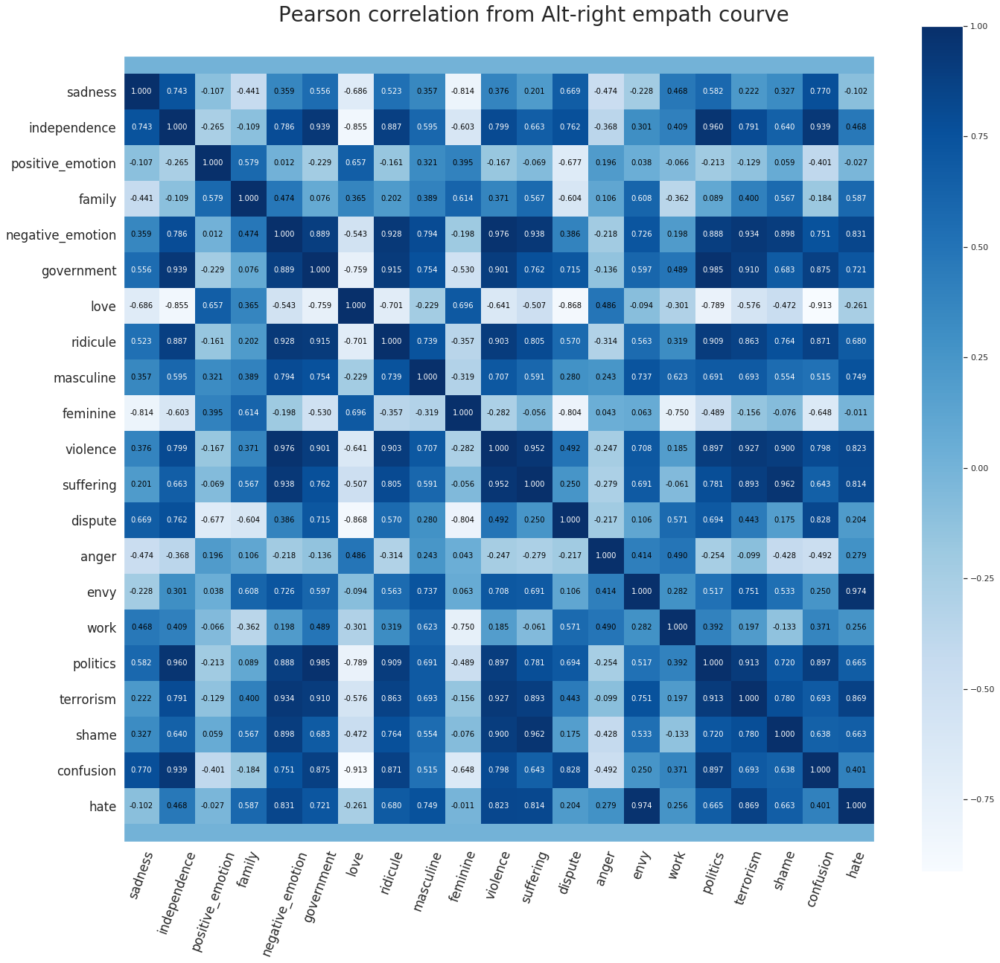

In [329]:
df_to_plot_empath("Alt-right")

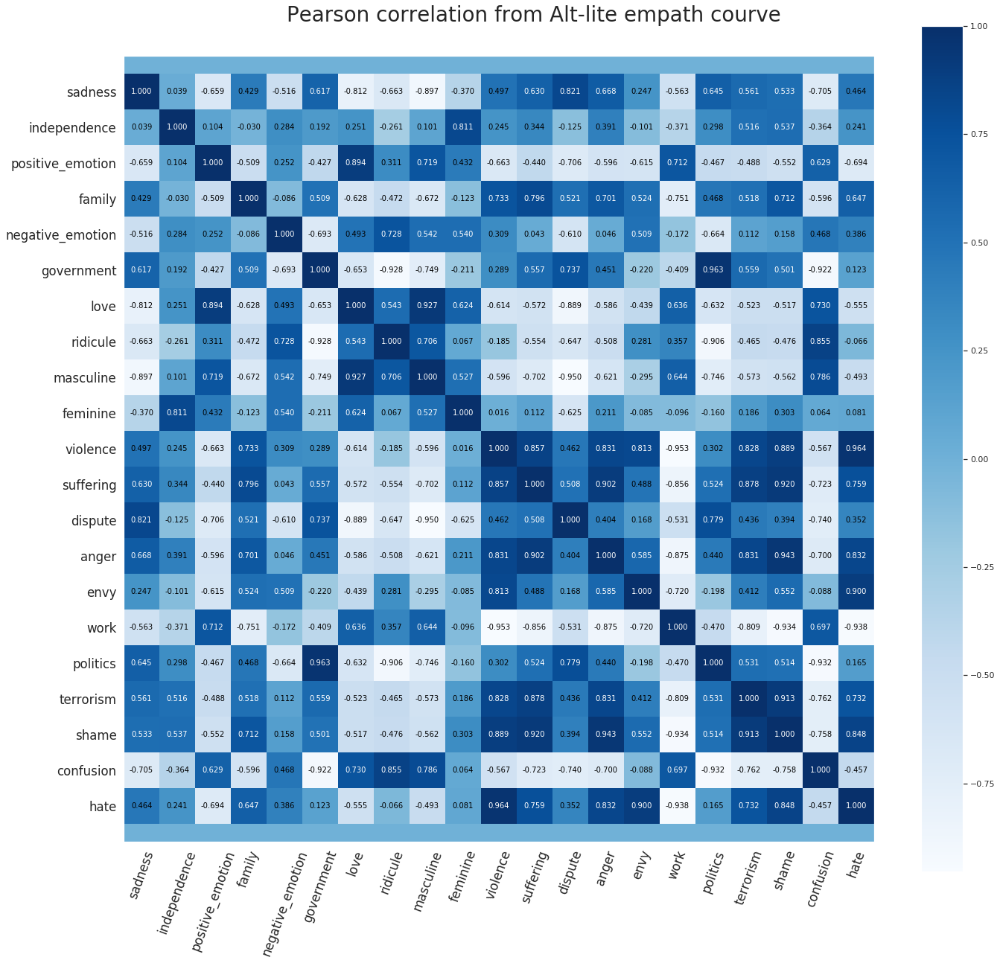

In [330]:
df_to_plot_empath("Alt-lite")

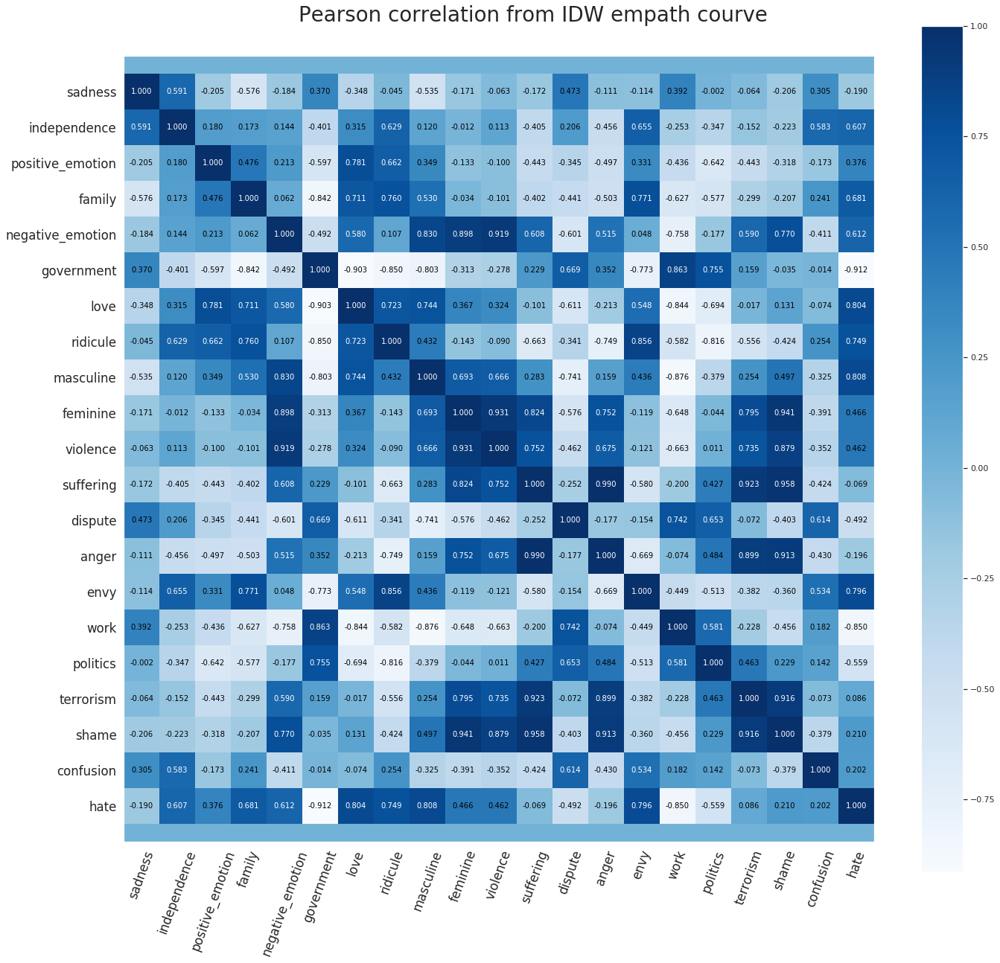

In [331]:
df_to_plot_empath("IDW")

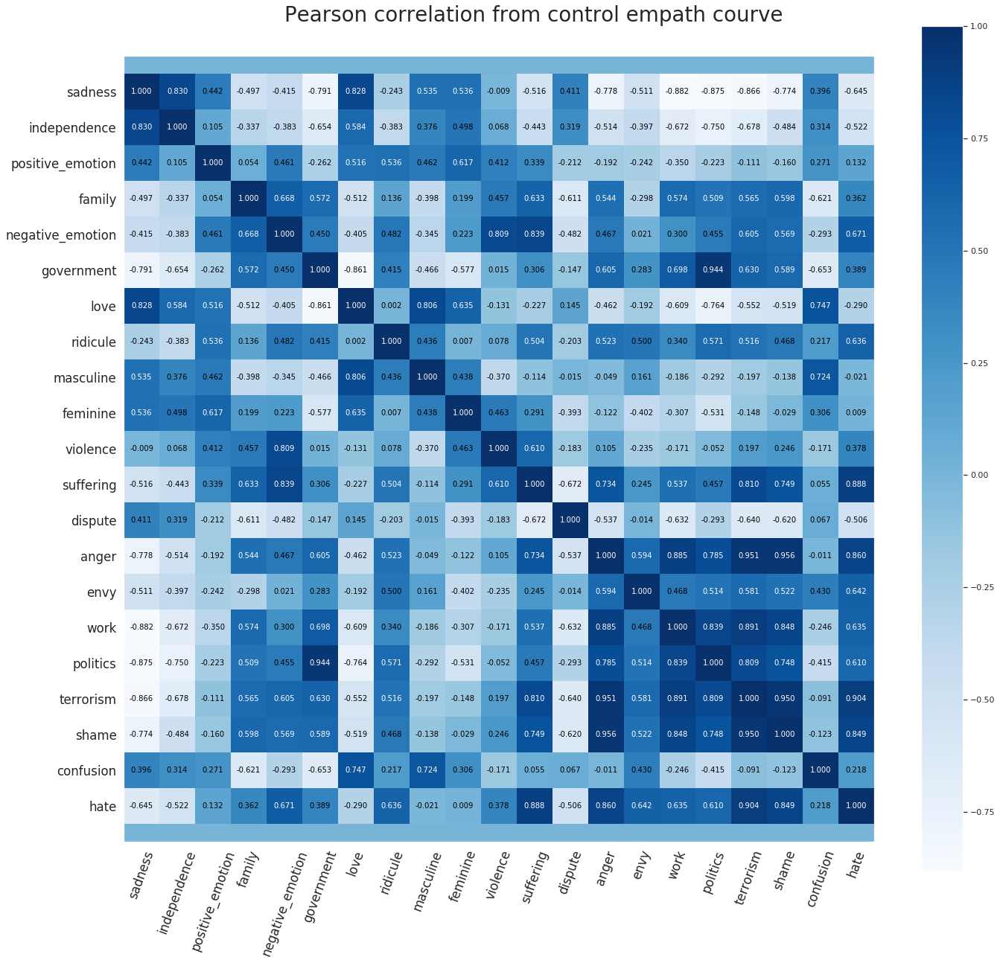

In [332]:
df_to_plot_empath("control")

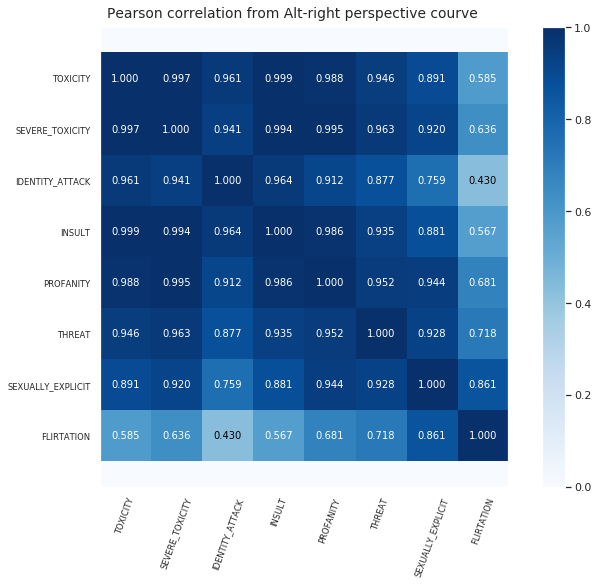

In [333]:
df_to_plot_perspective("Alt-right")

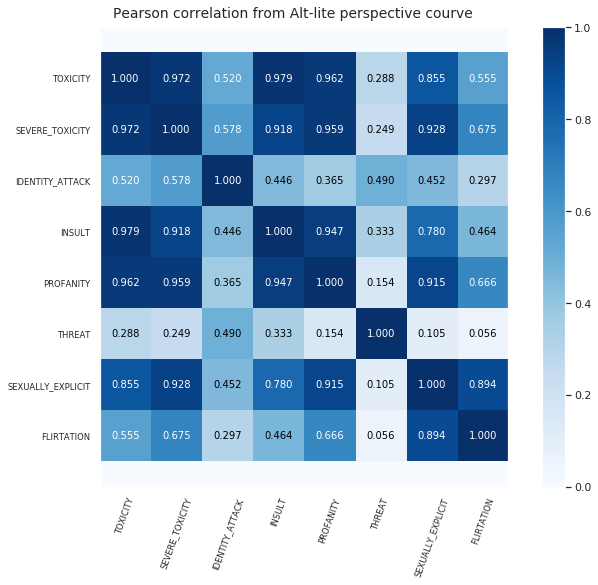

In [334]:
df_to_plot_perspective("Alt-lite")

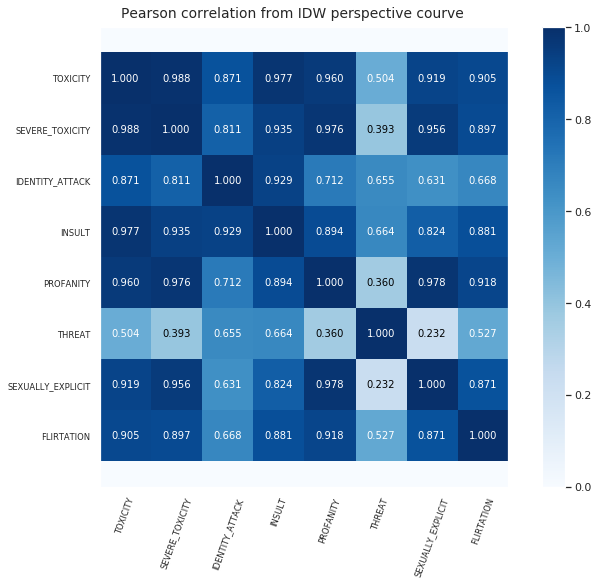

In [335]:
df_to_plot_perspective("IDW")

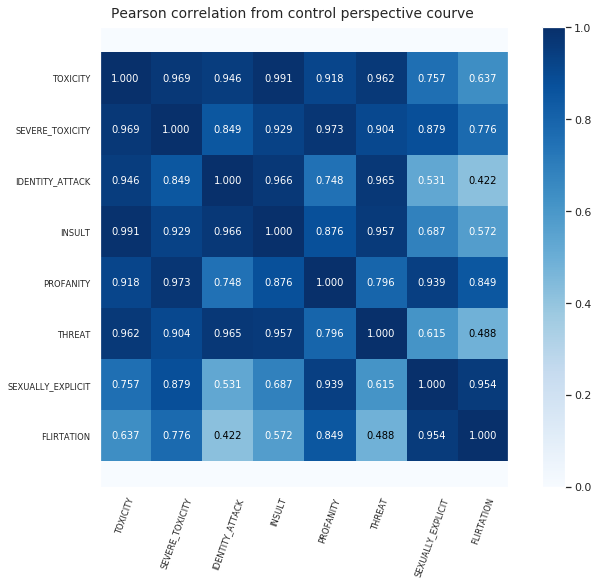

In [336]:
df_to_plot_perspective("control")

In [99]:
matrixes = []
for name in ["Alt-right", "Alt-lite", "IDW", "control"]:
    df = pd.read_csv(f"./perspective/dataframes/{name}.csv")
    arr = df.values

    arr = np.delete(arr, 9, 1)
    arr = np.delete(arr, 0, 1)

    z = np.zeros([10, 8])
    matrix = np.corrcoef(arr.T)
    for i in range(8):
        for j in range(8):
            z[i+1][j] = matrix[i][j]
            
    matrixes.append(z)

In [100]:
names = ["Alt-right", "Alt-lite", "IDW", "control"]

In [121]:
size=8

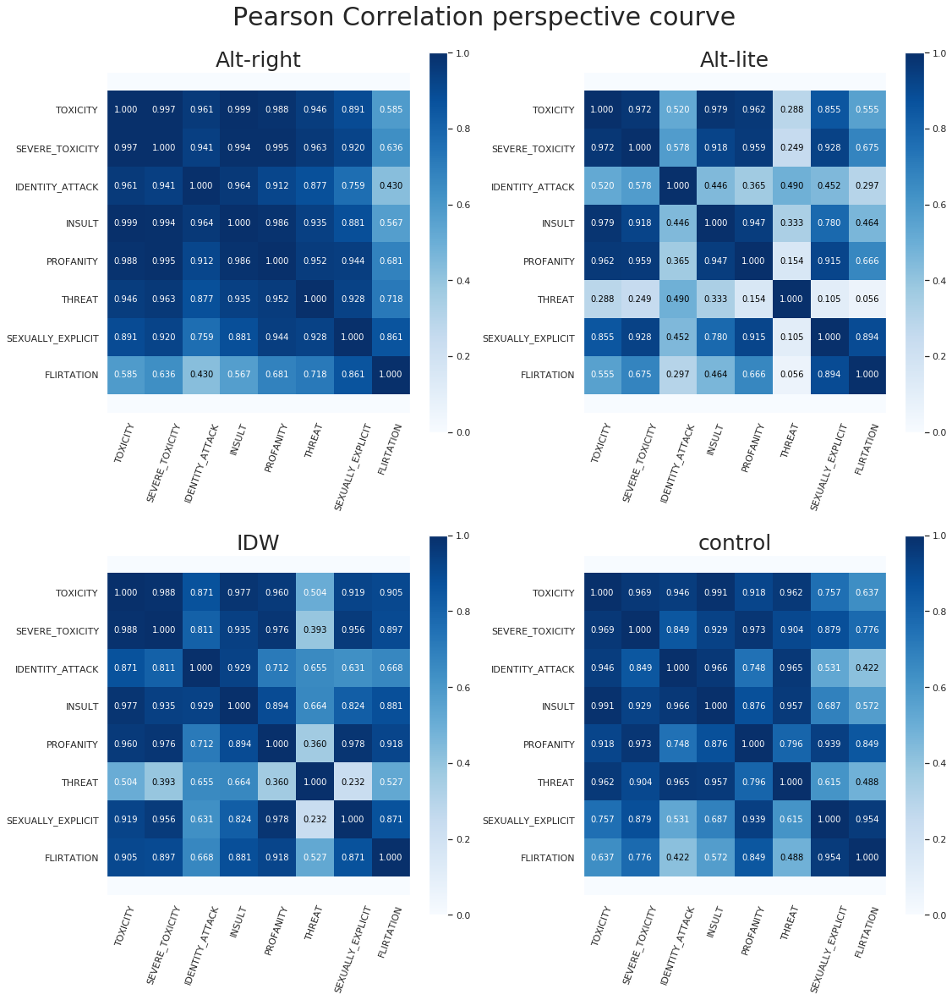

In [122]:
nr_rows = 2
nr_cols = 2  
prop = 1

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*size, nr_rows*size), squeeze=False)

plt.suptitle("Pearson Correlation perspective courve", y=1.03, fontsize=30*prop)

for r in range(0,nr_rows):
    for c in range(0, nr_cols): 
        col = r*nr_cols+c

        if col < len(matrixes):
            
            matrix = matrixes[col]
            cmap=plt.cm.Blues
            axs[r][c].grid(False)
            axs[r][c].tick_params(axis='x', rotation=70)
            axs[r][c].tick_params(axis='y')
            axs[r][c].set_title(names[col], fontsize=25)
            
            im = axs[r][c].imshow(matrix, interpolation='nearest', cmap=cmap)
            axs[r][c].figure.colorbar(im, ax=axs[r][c])

            # We want to show all ticks...
            axs[r][c].set(xticks=np.arange(matrix.shape[1]),
                   yticks=np.arange(matrix.shape[0]),
                   # ... and label them with the respective list entries,
                   xticklabels=attributes, yticklabels=[""] + attributes)
            # Loop over data dimensions and create text annotations.
            fmt = '.3f'
            thresh = matrix.max() / 2.
            for i in range(matrix.shape[0]):
                for j in range(matrix.shape[1]):
                    if i==0 or i==len(attributes)+1: continue
                    axs[r][c].text(j, i, format(matrix[i, j], fmt),
                            ha="center", va="center",
                            color="white" if matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.savefig(f'./pearson_coeff/pearson_correlation_perspective_matrix_square.png', bbox_inches = 'tight')
plt.show()

In [12]:
import networkx as nx
import itertools

In [238]:
G = nx.Graph()

In [202]:
G.add_nodes_from(attributes)

In [192]:
df = pd.read_csv(f"./perspective/IDW.csv")
arr = df.values

arr = np.delete(arr, 9, 1)
arr = np.delete(arr, 0, 1)

corref= np.corrcoef(arr.T)


In [239]:
for row in range(8):
    for col in range(8):
        if row==col: continue
        G.add_weighted_edges_from([[attributes[row], attributes[col], corref[row][col]]])


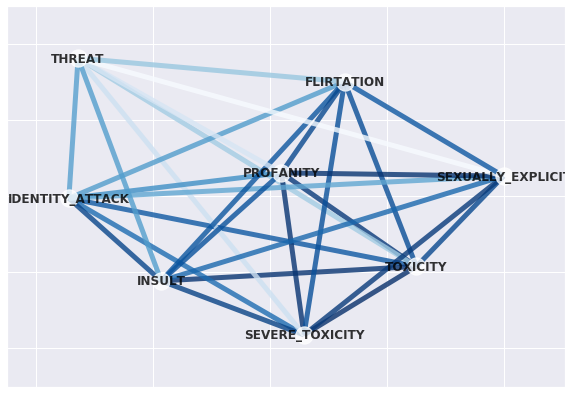

In [292]:
fig, axs = plt.subplots(1, 1, figsize=(10, 7), squeeze=False, sharex=True, sharey=True)

size = [G.edges[i]['weight'] for i in G.edges]
nx.draw_networkx(G, pos=nx.spring_layout(G, seed=6, scale=0.1), with_labels=True, alpha=0.8, font_color="0.0",
                 edge_color=np.array(size), width=5, edge_cmap=plt.cm.Blues, node_color='w',font_weight="bold")

/home/grad/ccomp/19/emanuelsilva/miniconda3/envs/myenv/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/grad/ccomp/19/emanuelsilva/miniconda3/envs/myenv/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/home/grad/ccomp/19/emanuelsilva/miniconda3/envs/myenv/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):


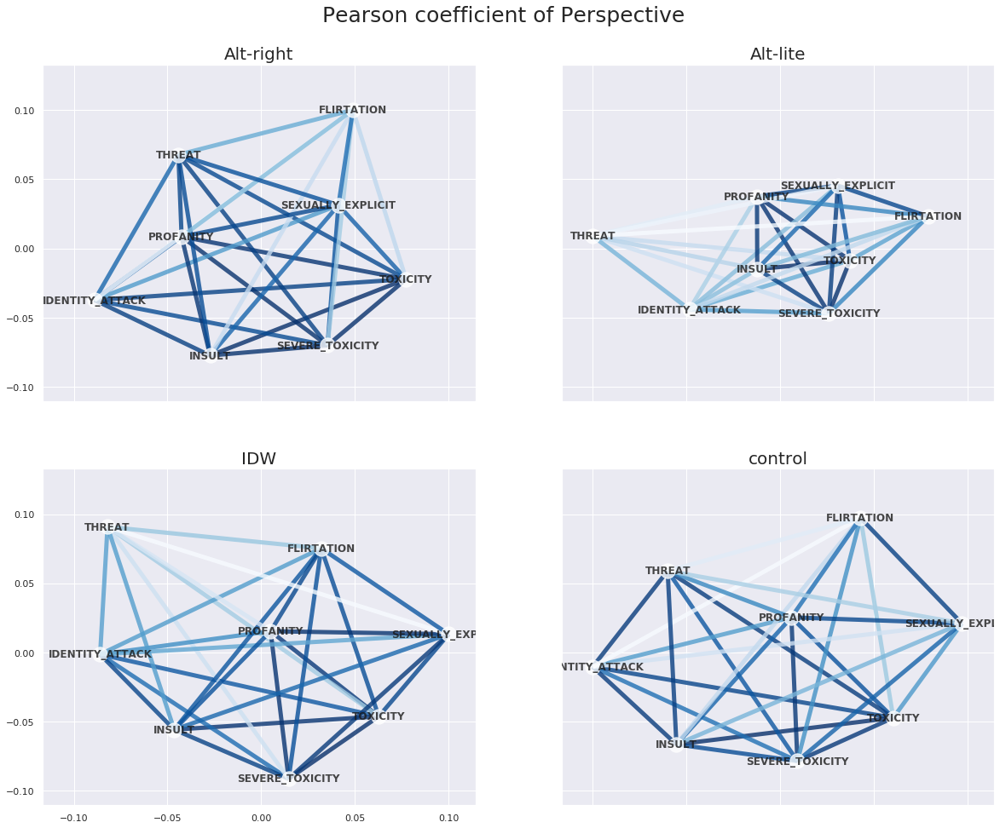

In [13]:
Graphs = []
nr_rows = 2
nr_cols = 2

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*10,nr_rows*8), squeeze=False, sharex=True, sharey=True)
fig.suptitle('Pearson coefficient of Perspective', fontsize=25, y=0.94)

for r in range(0, nr_rows):
    for c in range(0, nr_cols): 
        col = r*nr_cols+c
        Gr = nx.Graph()
        
        df = pd.read_csv(f"./perspective/{names[col]}.csv")
        arr = df.values
        arr = np.delete(arr, 9, 1)
        arr = np.delete(arr, 0, 1)
        corref= np.corrcoef(arr.T)
        
        for rr in range(8):
            for cc in range(8):
                if rr==cc: continue
                Gr.add_weighted_edges_from([[attributes[rr], attributes[cc], corref[rr][cc]]])

        no_degree = []
        size = []
        
        for node in Gr.nodes:
            if Gr.degree(node, weight='weight') == 0:
                no_degree.append(node)
            else:
                size.append(Gr.degree(node, weight='weight'))
    
        Gr.remove_nodes_from(no_degree)
        
        axs[r, c].set_title(names[col], fontsize=20)
        
        size = [Gr.edges[i]['weight'] for i in Gr.edges]
        nx.draw_networkx(Gr, pos=nx.spring_layout(Gr, seed=6, scale=0.1), with_labels=True, alpha=0.8,
                         edge_color=np.array(size), width=5, ax=axs[r, c],
                         edge_cmap=plt.cm.Blues, node_color='w',font_weight="bold")
plt.savefig("./pearson_coeff/pearson_correlation_perspective_graph.png",bbox_inches = 'tight')

In [ ]:
Graphs = []
nr_rows = 2
nr_cols = 2

fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*10,nr_rows*8), squeeze=False, sharex=True, sharey=True)
fig.suptitle('Pearson coefficient of Empath', fontsize=25, y=0.94)

for r in range(0, nr_rows):
    for c in range(0, nr_cols): 
        col = r*nr_cols+c
        Gr = nx.Graph()
        
        df = pd.read_csv(f"./empath/{names[col]}.csv")
        arr = df.values
        arr = np.delete(arr, 0, 1)
        arr = np.delete(arr, 1, 1)
        arr = np.delete(arr, 21, 1)
        arr = np.delete(arr, 0, 0)
        arr = np.delete(arr, 1, 0)
        arr = np.delete(arr, 2, 0)
        corref= np.corrcoef(arr.T)
        
        for rr in range(21):
            for cc in range(21):
                if rr==cc: continue
                Gr.add_weighted_edges_from([[emotion_list[rr], emotion_list[cc], corref[rr][cc]]])

        no_degree = []
        size = []
        
        for node in Gr.nodes:
            if Gr.degree(node, weight='weight') == 0:
                no_degree.append(node)
            else:
                size.append(Gr.degree(node, weight='weight'))
    
        Gr.remove_nodes_from(no_degree)
        
        axs[r, c].set_title(names[col], fontsize=20)
        
        size = [Gr.edges[i]['weight'] for i in Gr.edges]
        nx.draw_networkx(Gr, pos=nx.spring_layout(Gr, seed=6, scale=0.1), with_labels=True, alpha=0.8,
                         edge_color=np.array(size), width=5, ax=axs[r, c],
                         edge_cmap=plt.cm.Blues, node_color='w',font_weight="bold")
plt.savefig("./pearson_coeff/pearson_correlation_empath_graph.png", bbox_inches = 'tight')